# GATv1

In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'ff-data:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3959649%2F6892693%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20241013%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20241013T101407Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D52dc8f63417c208739eb691279b26fe84b39658f807115a3dd71888a7afaa38001aaa1da47761fd39940358b301650a01664b81378294aae0eb82a3775d9079891de1816562932dc8f245a1f0fc128ea74f19dbe88fc9f7bb84da305d62672e02d3586460eb63f714346a070bbbecd11db1727fb787dec2bfa3000c2f1371e7dd06d9f9d321e0210cb4f776a9a2d13f7180a5a3f845fcfb23fb2b0beffbb6613ea6f0229803189085d7c5f92ac00553024cb31b2bf8267b624b2447da422bbd1a3ae7527aad7c921260a515d789b789d909e554ab6d5186aa9c85cbbf32df0502db935e7b34b3c1266045298913d8a757ae24f79f0bc902e726e838a6dd0e17e,nuaaaa:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4133693%2F7157541%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20241013%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20241013T101407Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D069ae40f952d5a276e60e5e724d1c8be3297ceb40e165d6493349c78b3ad4931cb7f6905cca32d11877cb93638c596a4707367d5d2594f80831d332ae6fe4cb2f8f12381239b8ce3a449f93f9f304db5031875f810d05c9a37ec8a8706e251cb31289da19d5547945a6c97480b5e5f575627bfe9f1b87af36e2f0cbe96b322fde1d3a9a896945243cd9bd6bf781f789eb3f73641f57fb4034c490aa82ff8ad056652ffad6beeff9b87ac0fb3decfaab0c80e36fe36087b5c2ab230b92da3c6fcdc546fce33ffd6581aacf28917deca24dbca26152c2661efd1e1dcbc307eed862efa02831c8953dc2f3ffe3d2655d9e2be07b452a4885348fdc0c801fda8f35c,dfdcdfdc:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4256754%2F7332880%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20241013%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20241013T101407Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D102d745c8a5cbecfcd46eb1cf06b6a32980aec92d8be2fa38a6a35c9bba901fd4a9a2fc542563eb63fafd3ba9de9a4a84b172dffb0a6aad3f292b088020aafea9ae2cd790f470c607720de404e241d8135a8da94cdd920756194749fe01454936c5843d4fd65340ee9d157376d47efab30fd608015fb023daad2e56f42f04418d8dd02ee9c4e4f45e046ef938f31140f81d246b8311b06e9ff0d8924f66ecb0f9731d8d87fc127f391b7c412c11ec4e9f387604628e4b514c985ebf92083259bafa8a9d1172b5066f19bf54b68d0e888c0c888ba9f6a348cdd1b04ed93d204aec989c969ef3317078cf57218de3bf66b49b95a820b3b6c4cfee55f7d3844e34c,fffffff:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4298928%2F7394400%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20241013%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20241013T101407Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D9e956b3c865e4a3502d76ef9377250fc7c9aeea069c42ca14449e1f42cefef5d85913e59b0c9d0cf967f3613fecc93815fa98b44436a6eff1814a4702600b36652e0fe49541ac4e45dbe2a4974210dbf3aa779853265e713c6976883e4f0f0409ff0e070e16ec3eb9e161fcbdf1d7ca02721ff68795031f6a6187b9bc748b4206cb90f99a86ec1359795b772441b0dd26e50bb42ee3f1fc47d0703efaa6e5f473433184077d4b09703f56743bb9dec35039f70e80f5b4d5e0faa2e205bea73b2d3868d0f93375561a87570c1b60d3842b8c70f4c09fde6dd72b17b7e392939f5c32fad0a7712643cb15da1f3e829563aca927f504628c896dd43fbed10a3edb8,090909090909:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F5694780%2F9385985%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20241013%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20241013T101407Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D99997c559d85912ff21a3e24111d55d8ba004fe9ba077d4a23fdf4202b1d73cd1bd5f46dd71a52e89fd78aada85ff6fac4514b2cc03de03649bd7df01b6c803d584aa7c22d0a167f4c90c2e907952c5c9fad86efac76cbc8501c2c16073782f5ad0df14ff5cd2c019329e22951f0313cb8b414d812653e3ddb568a312f0c1e46fb757864d308bd90473144b47c2e1189f13fcbc70794b7b3a1d8e1f00f5fb229ea9ed5559b823e127c703ac9809181509362e299972c6e6ebd2a75d1ce4c1888b827c39af4b8a43dfbdc8b1f96c6b519bca3a149f9558805544e43bf38bc1ab049ccd32356a0ab7abc8d0691da638c0256de3c64f15df4dbd3b84405357d9f3f'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 15381205490 bytes downloaded

Downloaded and uncompressed: ff-data


[==================================================] 399138303 bytes downloaded

Downloaded and uncompressed: nuaaaa


[==================================================] 11254869684 bytes downloaded

Downloaded and uncompressed: dfdcdfdc


[==================================================] 1650305 bytes downloaded

Downloaded and uncompressed: fffffff


[==================================================] 41764703 bytes downloaded

Downloaded and uncompressed: 090909090909

Data source import complete.


In [ ]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.6 MB/s eta 0:00:00a 0:00:01


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from PIL import Image
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np

from torch_geometric.nn import GATConv
from torch_geometric.data import Data

from tqdm import tqdm

class ASDataset(Dataset):
    def __init__(self, client_file: str, imposter_file: str, transforms=None):
        with open(client_file, "r") as f:
            client_files = f.read().splitlines()
        with open(imposter_file, "r") as f:
            imposter_files = f.read().splitlines()
        self.labels = torch.cat((torch.ones(len(client_files)), torch.zeros(len(imposter_files))))
        self.imgs = client_files + imposter_files
        self.transforms = transforms

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_name = self.imgs[idx]
        img = Image.open(img_name).convert('RGB')
        label = self.labels[idx]
        if self.transforms:
            img = self.transforms(img)
        return img, label

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

train_dataset = ASDataset(client_file="/kaggle/input/fffffff/client_train.txt", imposter_file="/kaggle/input/fffffff/imposter_train.txt", transforms=preprocess)
val_dataset = ASDataset(client_file="/kaggle/input/fffffff/client_test.txt", imposter_file="/kaggle/input/fffffff/imposter_test.txt", transforms=preprocess)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

class ResNetGAT(nn.Module):
    def __init__(self, num_classes=1):
        super(ResNetGAT, self).__init__()
        resnet = models.resnet50(pretrained=True)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        self.gat_layer = GATConv(in_channels=2048, out_channels=512, heads=9, concat=True)
        self.fc = nn.Linear(512*9, num_classes)

    def forward(self, x):
        batch_size = x.size(0)
        x = self.backbone(x)
        x = x.view(batch_size, 2048, -1)
        x = x.permute(0, 2, 1)

        all_outputs = []
        attentions = []
        for i in range(batch_size):
            node_features = x[i]
            edge_index = create_grid_edge_index(7, 7, device=x.device)
            node_features, attn = self.gat_layer(node_features, edge_index, return_attention_weights=True)
            x_pool = node_features.mean(dim=0)
            all_outputs.append(x_pool)
            attentions.append(attn)

        x = torch.stack(all_outputs)
        x = self.fc(x)
        return x, attentions


def create_grid_edge_index(height, width, device):
    edge_index = []
    for i in range(height):
        for j in range(width):
            idx = i * width + j
            if j < width - 1:
                right_idx = i * width + (j + 1)
                edge_index.append([idx, right_idx])
                edge_index.append([right_idx, idx])
            if i < height - 1:
                bottom_idx = (i + 1) * width + j
                edge_index.append([idx, bottom_idx])
                edge_index.append([bottom_idx, idx])
    edge_index = torch.tensor(edge_index, dtype=torch.long, device=device).t()
    return edge_index

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ResNetGAT().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=3e-4)

num_epochs = 5
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for imgs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        imgs = imgs.to(device)
        labels = labels.unsqueeze(1).to(device)
        optimizer.zero_grad()
        outputs, _ = model(imgs)
        loss = criterion(outputs, labels.float())
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * imgs.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

  warnings.warn(

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.

  warnings.warn(msg)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth

100%|██████████| 97.8M/97.8M [00:00<00:00, 151MB/s]

Epoch 1/5: 100%|██████████| 65094/65094 [1:10:19<00:00, 15.43it/s]


Epoch 1/5, Loss: 0.0265


Epoch 2/5: 100%|██████████| 65094/65094 [1:07:50<00:00, 15.99it/s]


Epoch 2/5, Loss: 0.0079


Epoch 3/5: 100%|██████████| 65094/65094 [1:07:04<00:00, 16.18it/s]


Epoch 3/5, Loss: 0.0043


Epoch 4/5: 100%|██████████| 65094/65094 [1:07:42<00:00, 16.02it/s]


Epoch 4/5, Loss: 0.0031


Epoch 5/5: 100%|██████████| 65094/65094 [1:06:45<00:00, 16.25it/s]

Epoch 5/5, Loss: 0.0023


# Примеры интерпретации

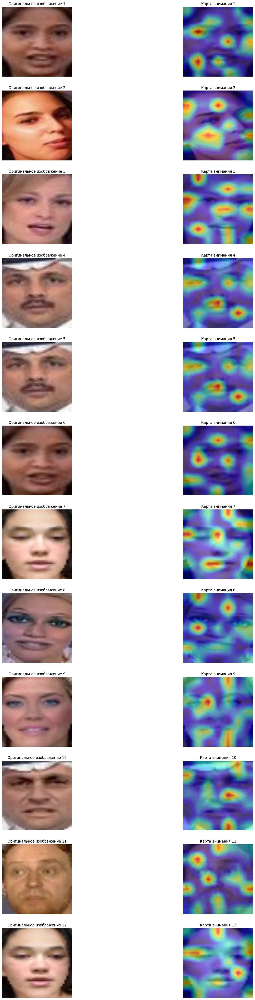

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms, models
from PIL import Image
from torch_geometric.nn import GATConv

image_paths = [
    '/kaggle/input/ff-data/Original/extracted_faces/org_421_frame_0834.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_476_frame_0150.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_967_frame_0194.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_000_frame_0000.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_000_frame_0000.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_421_frame_0833.jpg.png',

    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_490646.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_6347.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_99999.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_1.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_35358.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_490645.jpg.png',
]

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def process_image(image_path):
    img = Image.open(image_path).convert('RGB')
    img_preprocessed = preprocess(img)
    img_preprocessed = img_preprocessed.unsqueeze(0).to(device)

    with torch.no_grad():
        outputs, attentions = model(img_preprocessed)

    original_img = np.array(img.resize((224, 224))) / 255.0

    edge_index, alpha = attentions[0]
    edge_index = edge_index.cpu().numpy()
    alpha = alpha.cpu().detach().numpy()

    alpha_mean = alpha.mean(axis=1)

    num_nodes = 7 * 7
    node_attention = np.zeros(num_nodes)
    for i in range(alpha_mean.shape[0]):
        src = edge_index[0, i]
        node_attention[src] += alpha_mean[i]

    node_attention = node_attention.reshape(7, 7)
    node_attention = (node_attention - node_attention.min()) / (node_attention.max() - node_attention.min())

    attention_map = np.array(Image.fromarray(node_attention).resize((224, 224), resample=Image.BILINEAR))

    return original_img, attention_map

plt.figure(figsize=(20, len(image_paths) * 5))

for i, image_path in enumerate(image_paths):
    original_img, attention_map = process_image(image_path)

    plt.subplot(len(image_paths), 2, 2 * i + 1)
    plt.imshow(original_img)
    plt.title(f'Оригинальное изображение {i+1}')
    plt.axis('off')

    plt.subplot(len(image_paths), 2, 2 * i + 2)
    plt.imshow(original_img)
    plt.imshow(attention_map, cmap='jet', alpha=0.5)
    plt.title(f'Карта внимания {i+1}')
    plt.axis('off')

plt.show()

# Metrics

In [ ]:
torch.save(model.state_dict(), 'model_weights.pth')

In [ ]:
torch.save(model, 'model_full.pth')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

  warnings.warn(

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.

  warnings.warn(msg)

<ipython-input-7-baffcf8da445>:52: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more de

F1 Score: 0.9968

Accuracy: 99.73%

ROC AUC: 1.0000


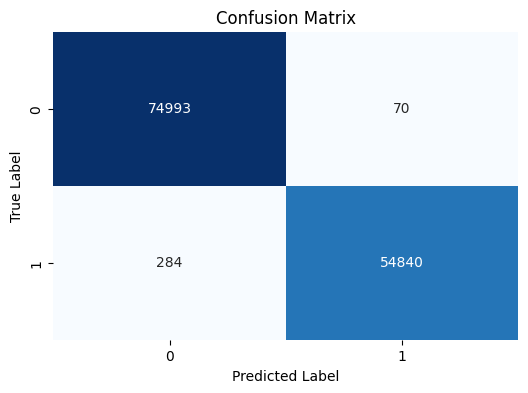

In [ ]:
import torch
from sklearn.metrics import f1_score, roc_auc_score, confusion_matrix
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_metrics(model, loader, device):
    model.eval()
    all_labels = []
    all_predictions = []
    all_probs = []

    with torch.no_grad():
        for imgs, labels in tqdm(loader, desc="Calculating Metrics"):
            imgs = imgs.to(device)
            labels = labels.unsqueeze(1).to(device)

            outputs, _ = model(imgs)

            probabilities = torch.sigmoid(outputs)
            predicted = (probabilities > 0.5).float()

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
            all_probs.extend(probabilities.cpu().numpy())

    f1 = f1_score(all_labels, all_predictions, average='binary')

    correct = (torch.tensor(all_predictions) == torch.tensor(all_labels)).sum().item()
    accuracy = correct / len(all_labels)

    roc_auc = roc_auc_score(all_labels, all_probs)

    cm = confusion_matrix(all_labels, all_predictions)

    return f1, accuracy, roc_auc, cm

def plot_confusion_matrix(cm):
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

model = ResNetGAT().to(device)
model.load_state_dict(torch.load('model_weights.pth'))

f1, accuracy, roc_auc, cm = calculate_metrics(model, val_loader, device)

print(f'F1 Score: {f1:.4f}')
print(f'Accuracy: {accuracy * 100:.2f}%')
print(f'ROC AUC: {roc_auc:.4f}')

plot_confusion_matrix(cm)

# GRAD CAM, LIME

In [ ]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install torchcam

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install lime

Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install captum

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.4 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [ ]:
image_paths = [
    '/kaggle/input/ff-data/Original/extracted_faces/org_421_frame_0834.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_476_frame_0150.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_967_frame_0194.jpg.png',

    '/kaggle/input/ff-data/Original/extracted_faces/org_000_frame_0000.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_000_frame_0000.jpg.png',
    '/kaggle/input/ff-data/Original/extracted_faces/org_421_frame_0833.jpg.png',

    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_490646.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_6347.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_99999.jpg.png',

    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_1.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_35358.jpg.png',
    '/kaggle/input/ff-data/Deepfake/extracted_faces/org_490645.jpg.png',
]

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

  warnings.warn(

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.

  warnings.warn(msg)


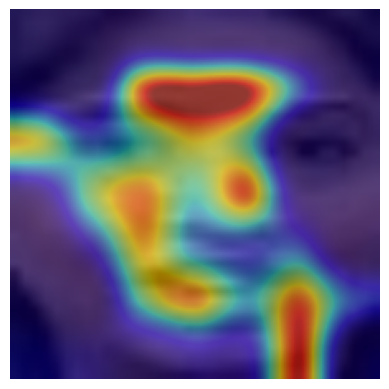

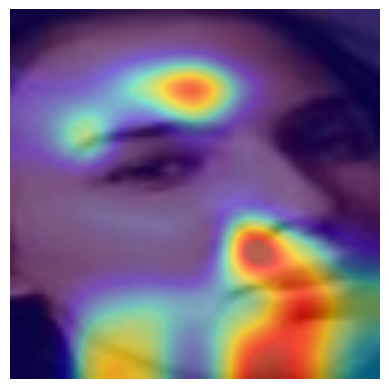

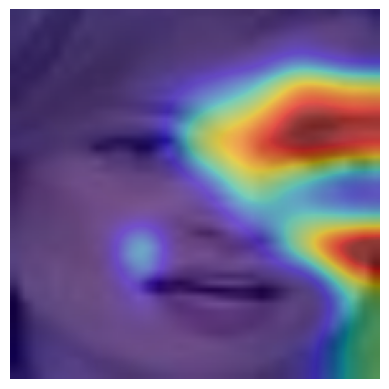

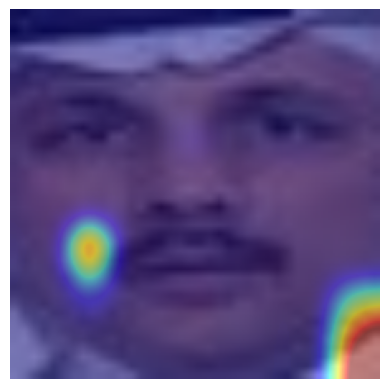

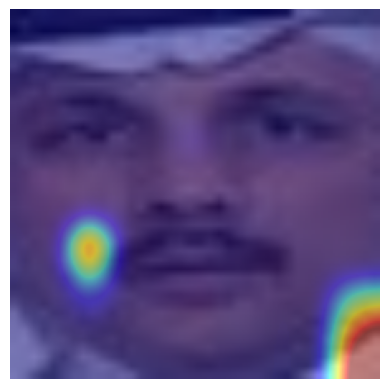

...

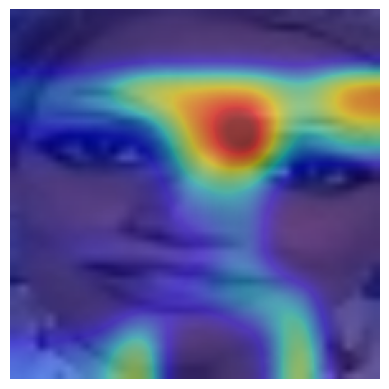

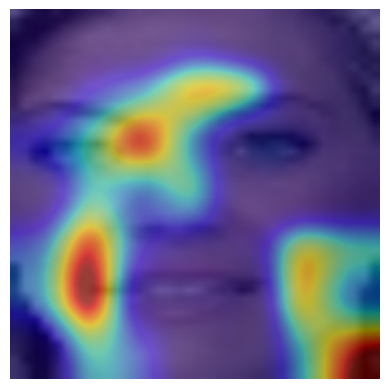

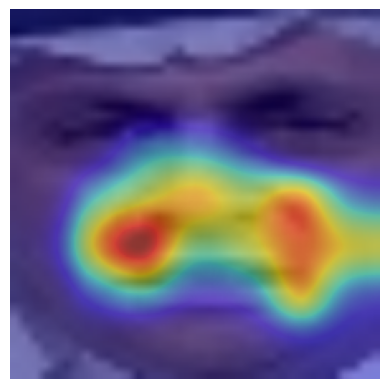

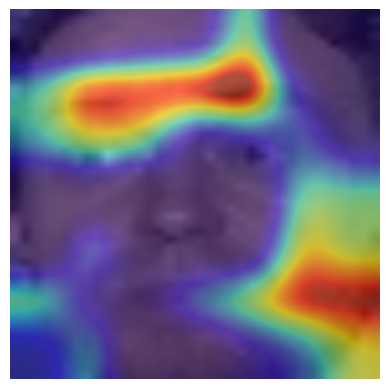

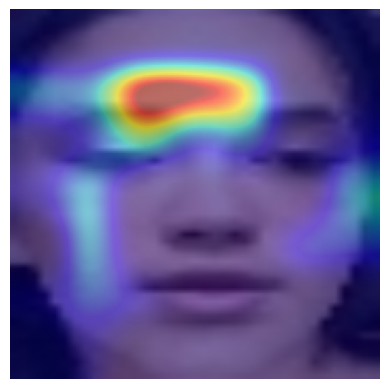

In [ ]:
import torch
from torchcam.methods import GradCAM
from torchvision.transforms import transforms
from torchcam.utils import overlay_mask
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

model = ResNetGAT().to(device)
model.eval()

cam_extractor = GradCAM(model, target_layer='backbone.7')

def visualize_cam(image_path, model, cam_extractor, device):
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0).to(device)

    img_tensor.requires_grad = True
    scores, _ = model(img_tensor)

    activation_map = cam_extractor(scores.squeeze(0).argmax().item(), scores)

    activation_map = activation_map[0].squeeze(0).cpu().numpy()

    original_img = np.array(img.resize((224, 224)))

    result = overlay_mask(
        Image.fromarray(original_img),
        Image.fromarray(activation_map, mode='F'),
        alpha=0.5
    )

    plt.imshow(result)
    plt.axis('off')
    plt.show()

for image_path in image_paths:
    visualize_cam(image_path, model, cam_extractor, device)

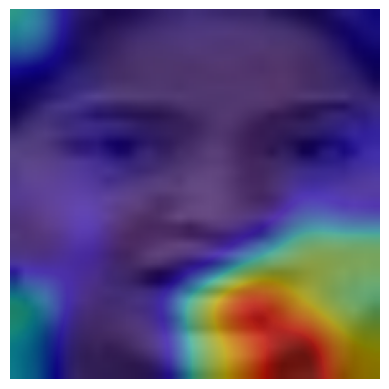

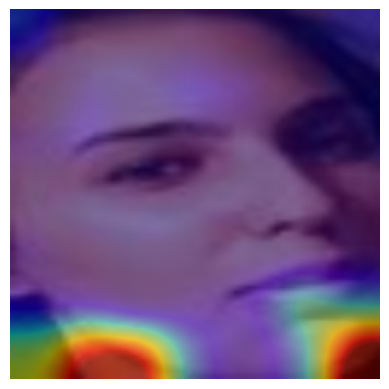

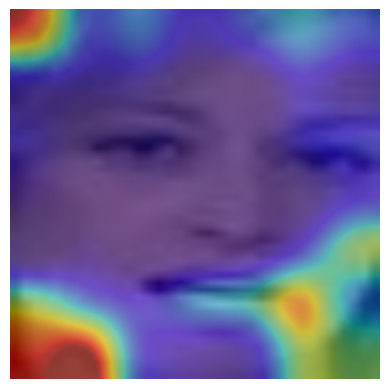

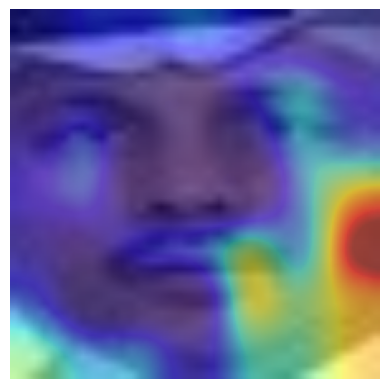

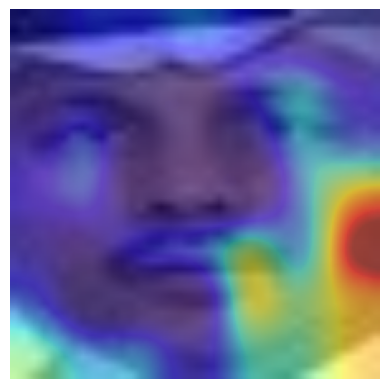

...

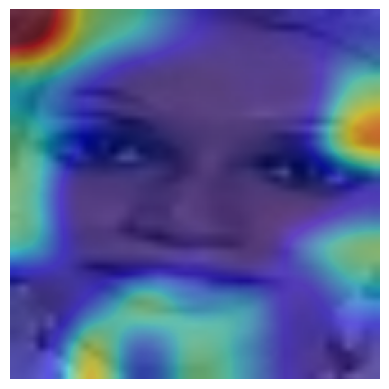

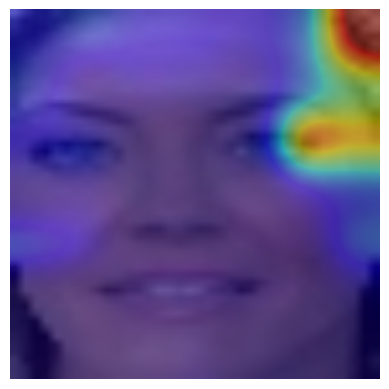

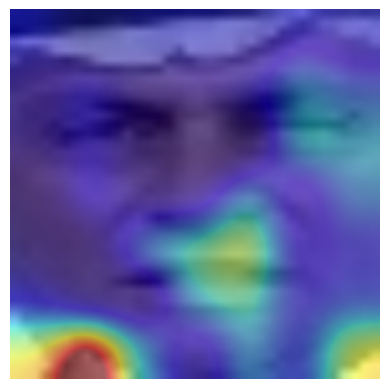

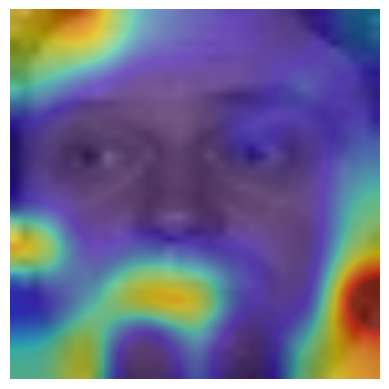

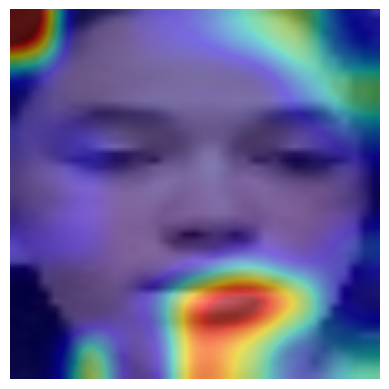

In [ ]:
import torch
from torchcam.methods import GradCAM
from torchvision.transforms import transforms
from torchcam.utils import overlay_mask
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

model = ResNetGAT().to(device)
model.eval()

cam_extractor = GradCAM(model, target_layer='backbone.7')

def visualize_cam(image_path, model, cam_extractor, device):
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0).to(device)

    img_tensor.requires_grad = True

    scores, _ = model(img_tensor)

    activation_map = cam_extractor(scores.squeeze(0).argmax().item(), scores)

    activation_map = activation_map[0].squeeze(0).cpu().numpy()

    original_img = np.array(img.resize((224, 224)))

    result = overlay_mask(
        Image.fromarray(original_img),
        Image.fromarray(activation_map, mode='F'),
        alpha=0.5
    )

    plt.imshow(result)
    plt.axis('off')
    plt.show()

for image_path in image_paths:
    visualize_cam(image_path, model, cam_extractor, device)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.

  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


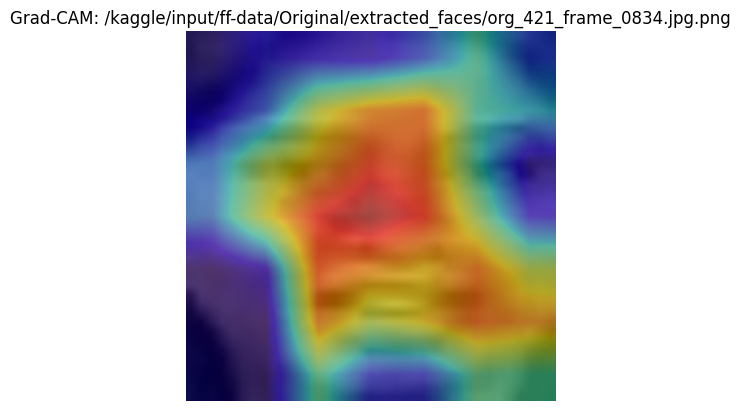

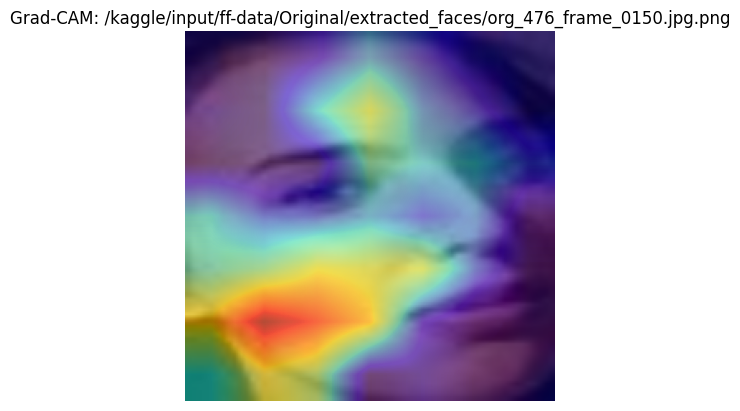

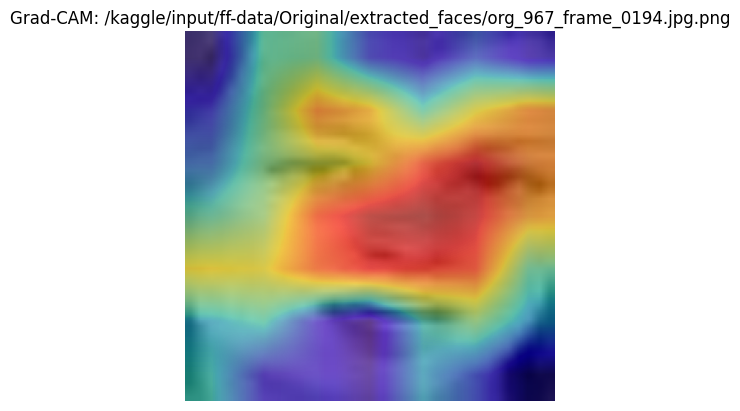

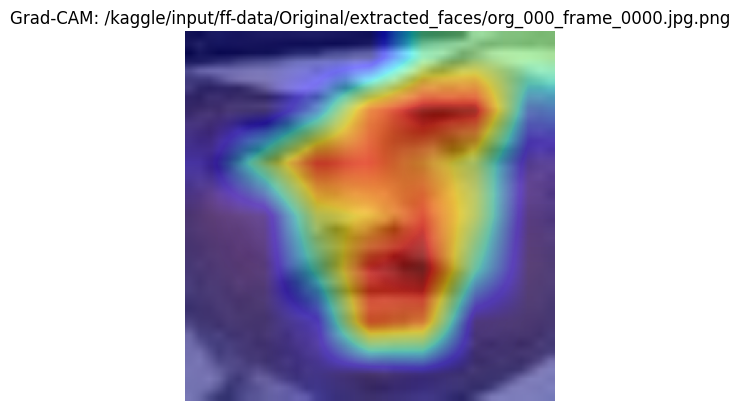

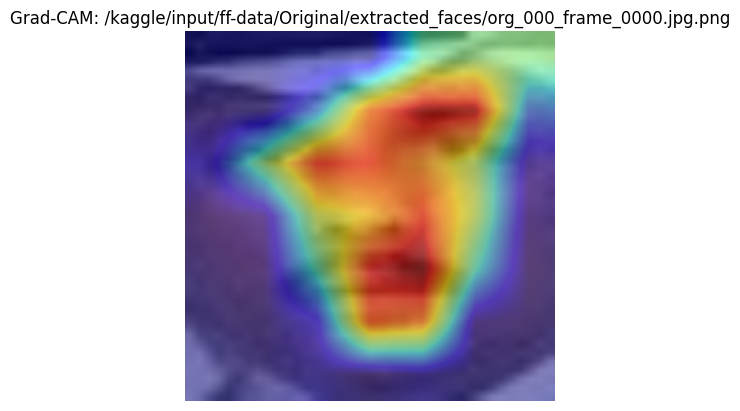

...

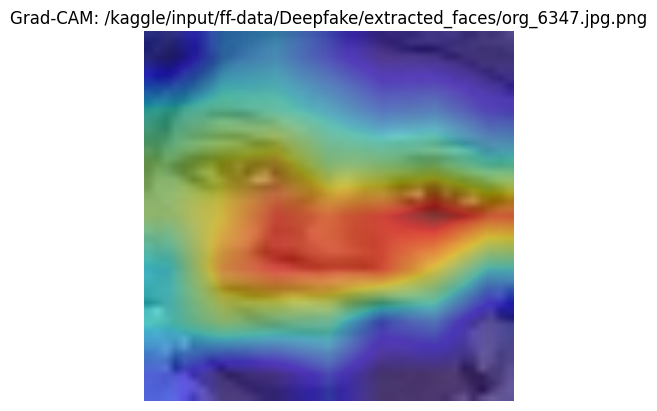

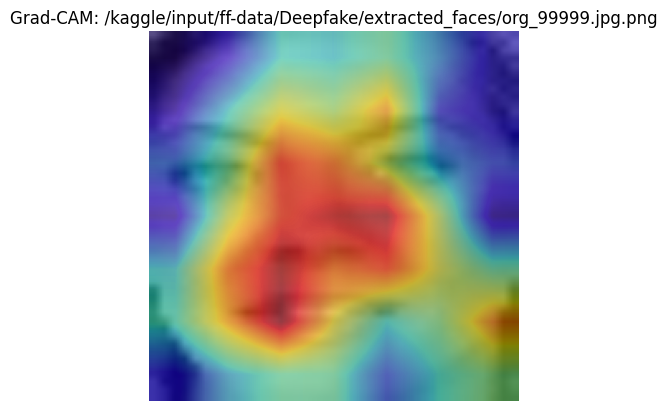

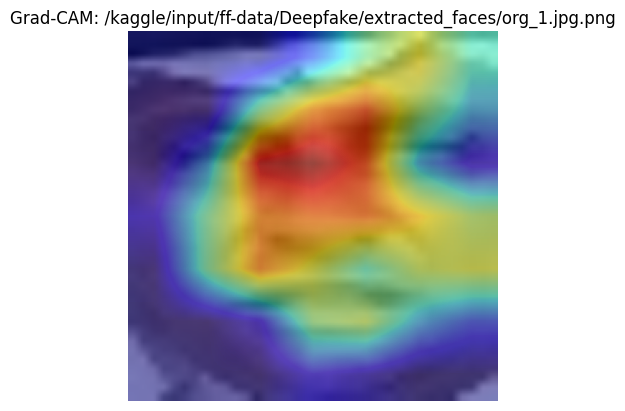

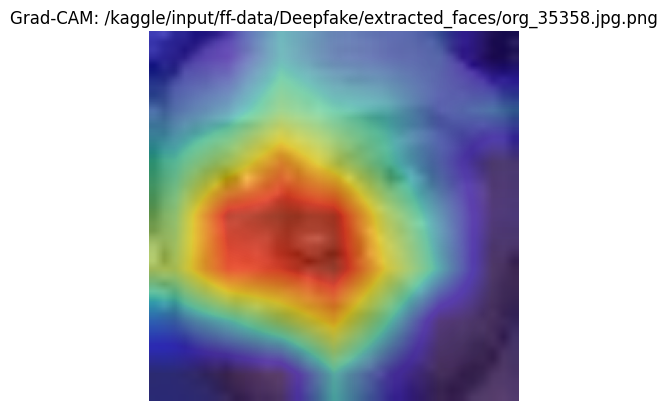

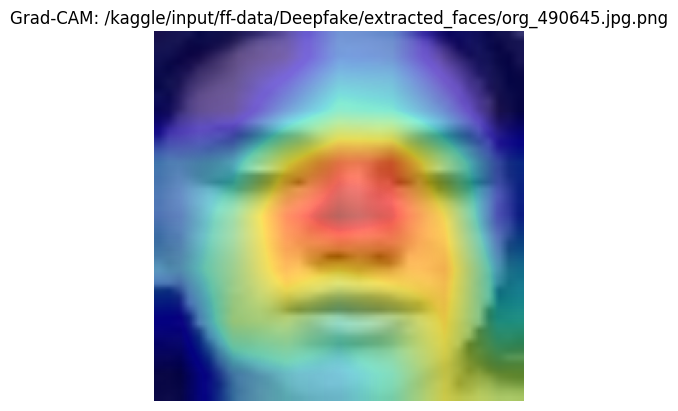

In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.activations = None
        self.target_layer = target_layer

        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, index=None):
        x = x.to(next(self.model.parameters()).device)
        self.model.zero_grad()
        outputs, _ = self.model(x)
        if index is None:
            index = outputs.argmax(dim=1).item()

        target = outputs[:, index]
        target.backward()

        gradients = self.gradients
        activations = self.activations

        weights = gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()

        cam -= cam.min()
        cam /= cam.max()
        return cam

target_layer = model.backbone[-1]
grad_cam = GradCAM(model, target_layer)

for image_path in image_paths:
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0).to(device)

    cam = grad_cam(img_tensor)

    plt.imshow(np.array(img.resize((224, 224))))
    plt.imshow(cam, cmap='jet', alpha=0.5)
    plt.title(f'Grad-CAM: {image_path}')
    plt.axis('off')
    plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

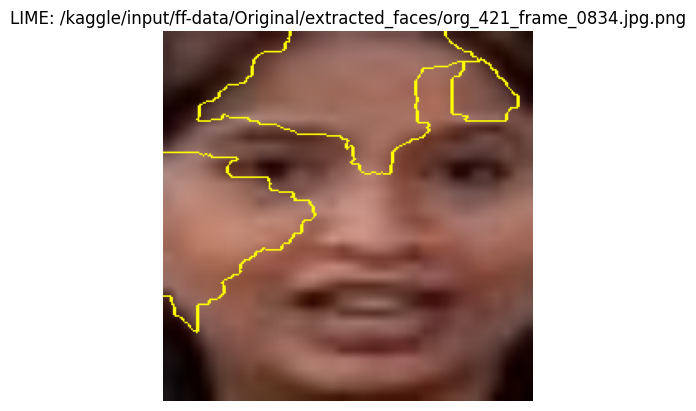

  0%|          | 0/1000 [00:00<?, ?it/s]

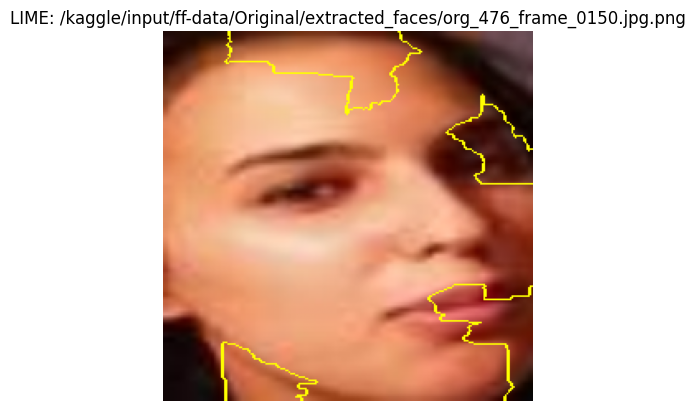

  0%|          | 0/1000 [00:00<?, ?it/s]

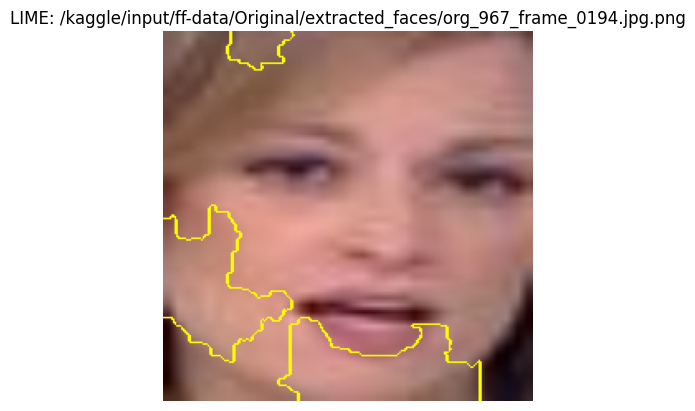

  0%|          | 0/1000 [00:00<?, ?it/s]

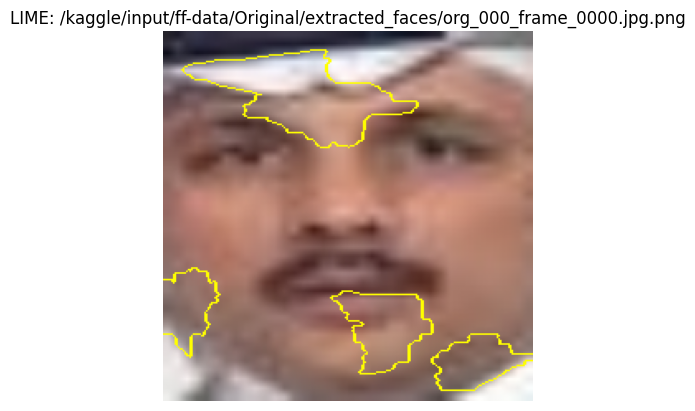

  0%|          | 0/1000 [00:00<?, ?it/s]

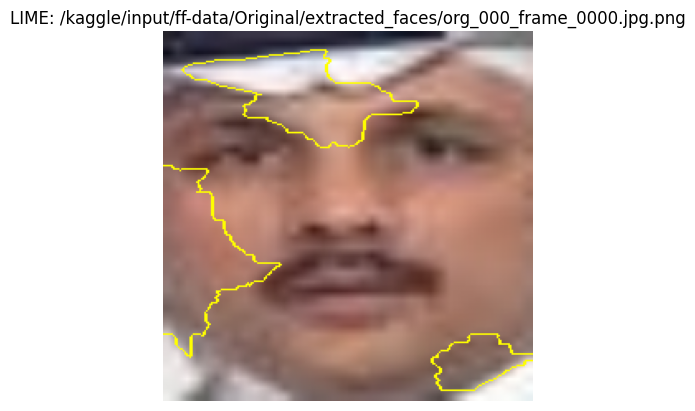

  0%|          | 0/1000 [00:00<?, ?it/s]

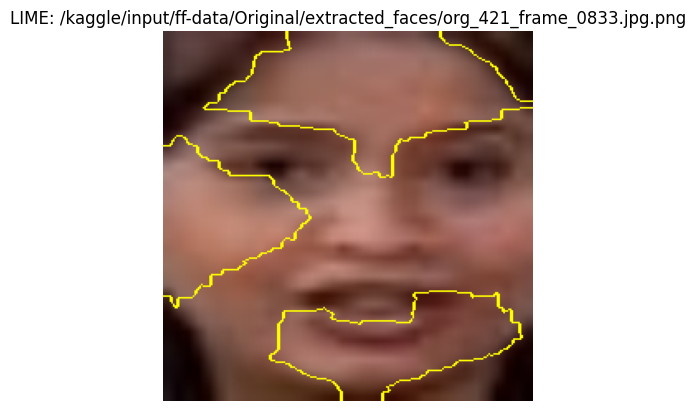

  0%|          | 0/1000 [00:00<?, ?it/s]

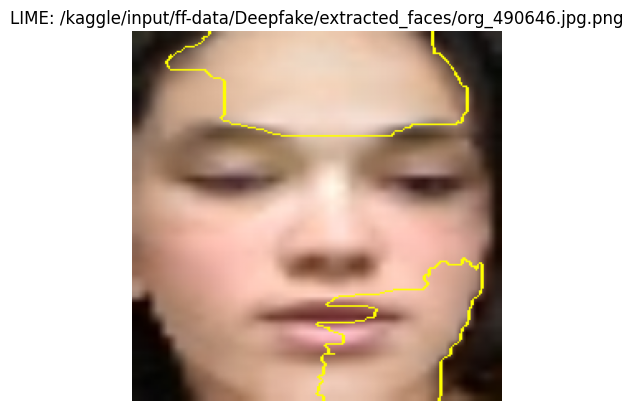

  0%|          | 0/1000 [00:00<?, ?it/s]

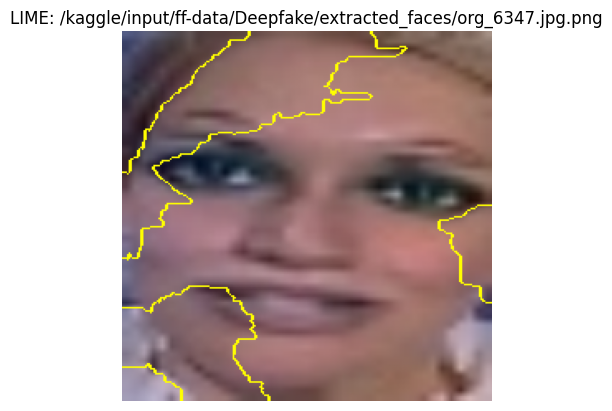

  0%|          | 0/1000 [00:00<?, ?it/s]

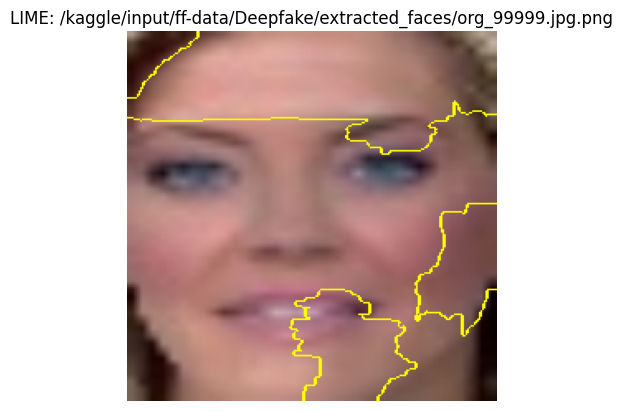

  0%|          | 0/1000 [00:00<?, ?it/s]

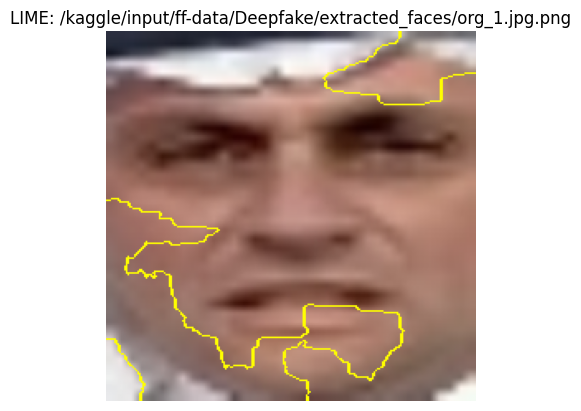

  0%|          | 0/1000 [00:00<?, ?it/s]

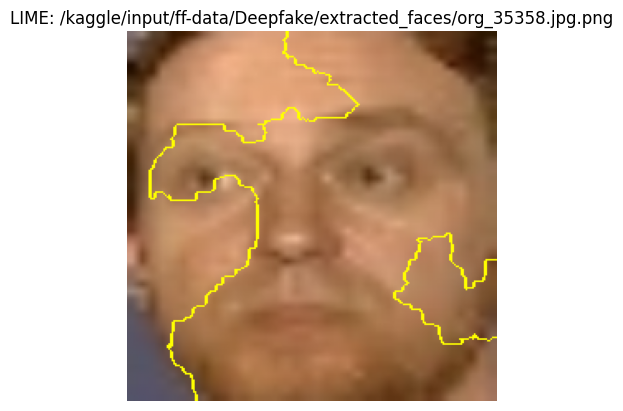

  0%|          | 0/1000 [00:00<?, ?it/s]

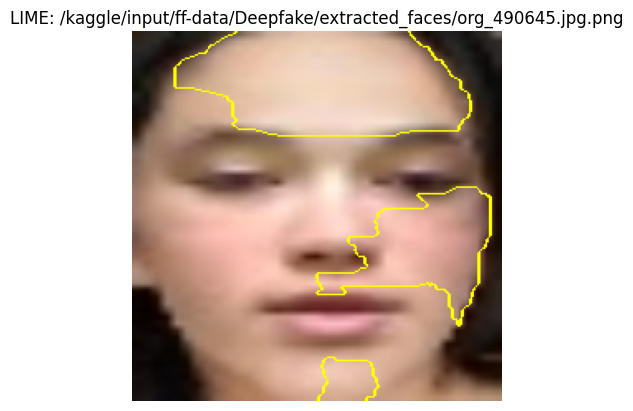

In [ ]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

def batch_predict(images):
    images = [preprocess(Image.fromarray(img)).to(device) for img in images]
    images = torch.stack(images)
    outputs, _ = model(images)
    probs = torch.sigmoid(outputs).detach().cpu().numpy()
    return np.concatenate((1 - probs, probs), axis=1)

explainer = lime_image.LimeImageExplainer()

for image_path in image_paths:
    img = Image.open(image_path).convert('RGB')
    img_np = np.array(img.resize((224, 224)))

    explanation = explainer.explain_instance(
        img_np,
        batch_predict,
        top_labels=1,
        hide_color=0,
        num_samples=1000
    )

    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=5,
        hide_rest=False
    )
    img_boundry = mark_boundaries(temp / 255.0, mask)
    plt.imshow(img_boundry)
    plt.title(f'LIME: {image_path}')
    plt.axis('off')
    plt.show()

In [ ]:
class ResNetGAT(nn.Module):
    def __init__(self, num_classes=1):
        super(ResNetGAT, self).__init__()
        resnet = models.resnet50(pretrained=True)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        self.gat_layer = GATConv(in_channels=2048, out_channels=512, heads=9, concat=True)

        self.fc = nn.Linear(512*9, num_classes)

    def forward(self, x):
        batch_size = x.size(0)
        x = self.backbone(x)
        x = x.view(batch_size, 2048, -1)
        x = x.permute(0, 2, 1)

        all_outputs = []
        attentions = []
        for i in range(batch_size):
            node_features = x[i]
            edge_index = create_grid_edge_index(7, 7, device=x.device)
            node_features, attn = self.gat_layer(node_features, edge_index, return_attention_weights=True)
            x_pool = node_features.mean(dim=0)
            all_outputs.append(x_pool)
            attentions.append(attn)

        x = torch.stack(all_outputs)
        x = self.fc(x)

        if return_attention:
            return x, attentions
        else:
            return x, None

In [ ]:
class ResNetGAT(nn.Module):
    def __init__(self, num_classes=1):
        super(ResNetGAT, self).__init__()
        resnet = models.resnet50(pretrained=True)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        self.gat_layer = GATConv(in_channels=2048, out_channels=512, heads=9, concat=True)

        self.fc = nn.Linear(512*9, num_classes)

    def forward(self, x):
        batch_size = x.size(0)
        x = self.backbone(x)
        x = x.view(batch_size, 2048, -1)
        x = x.permute(0, 2, 1)

        all_outputs = []
        attentions = []
        for i in range(batch_size):
            node_features = x[i]
            edge_index = create_grid_edge_index(7, 7, device=x.device)
            node_features, attn = self.gat_layer(node_features, edge_index, return_attention_weights=True)
            x_pool = node_features.mean(dim=0)
            all_outputs.append(x_pool)
            attentions.append(attn)

        x = torch.stack(all_outputs)
        x = self.fc(x)
        return x

In [ ]:
import torch
import torch.nn as nn

class WrappedModel(nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, x):
        outputs, _ = self.model(x, return_attention=False)
        return outputs

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ResNetGAT().to(device)
model.eval()

wrapped_model = WrappedModel(model).to(device)
wrapped_model.eval()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


WrappedModel(
  (model): ResNetGAT(
    (backbone): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
    

In [ ]:
wrapped_model = ResNetGAT().to(device)
wrapped_model.eval()

ResNetGAT(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(6

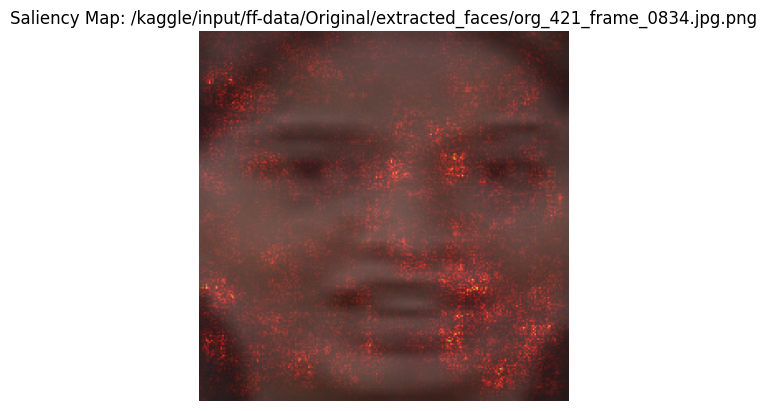

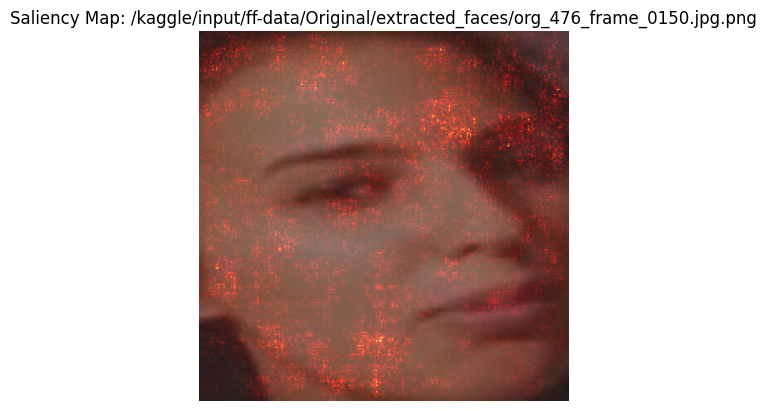

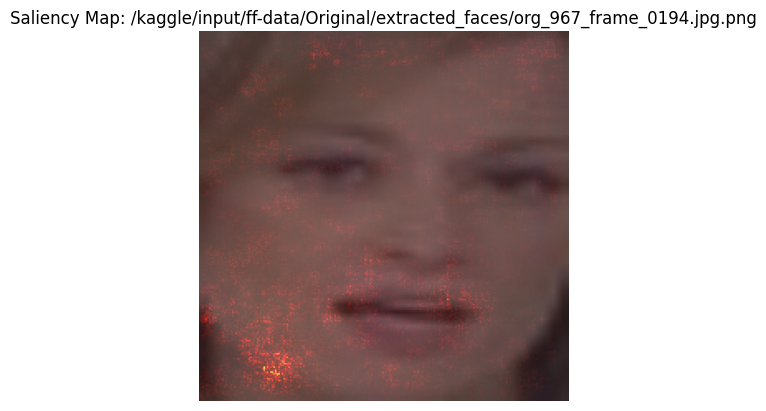

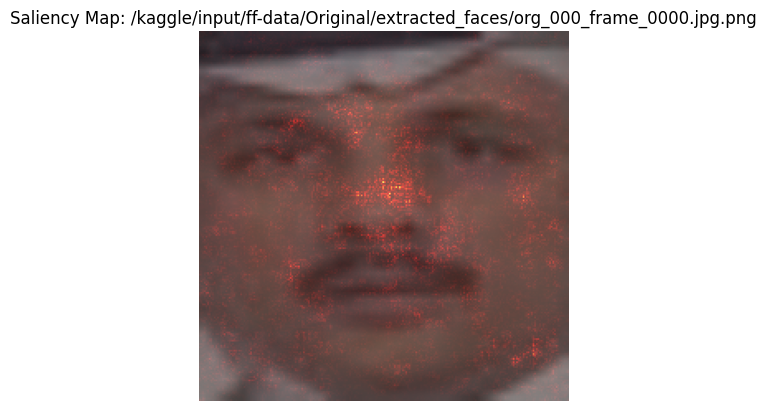

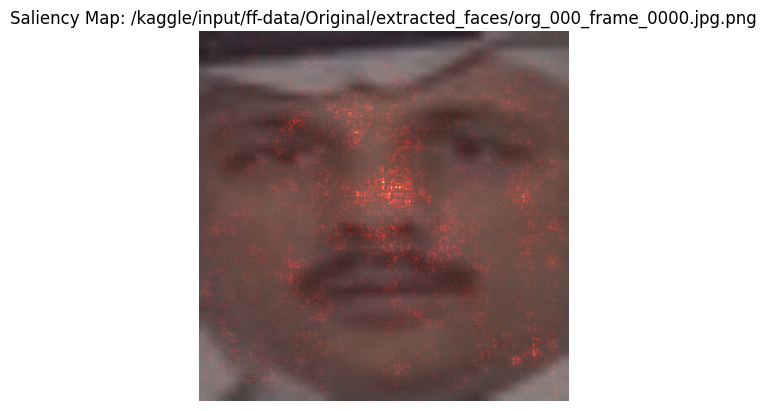

...

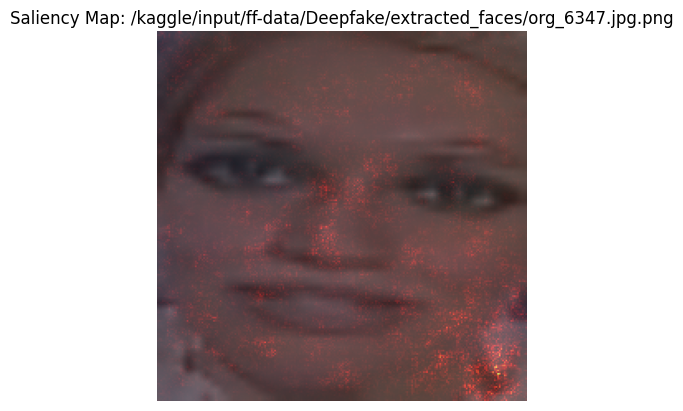

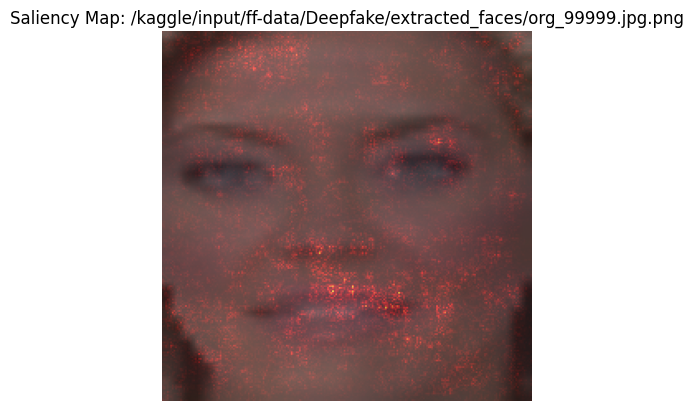

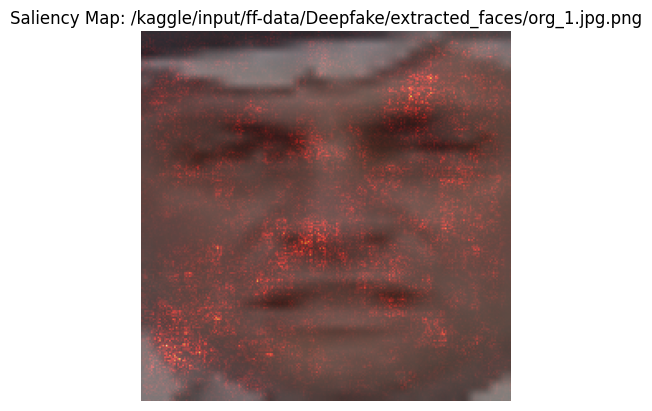

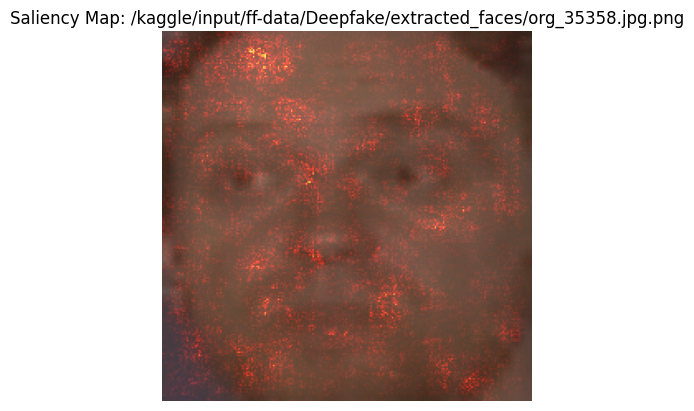

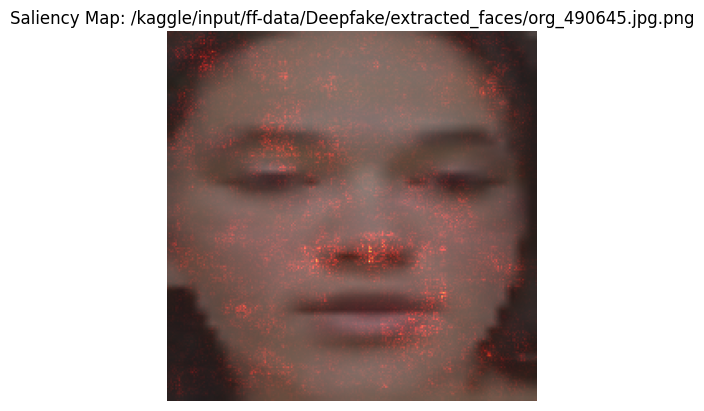

In [ ]:
from captum.attr import Saliency

saliency = Saliency(wrapped_model)

for image_path in image_paths:
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0).to(device)
    img_tensor.requires_grad = True

    attributions = saliency.attribute(img_tensor, target=0)

    attributions = attributions.squeeze().cpu().detach().numpy()
    attributions = np.abs(attributions).sum(axis=0)

    attributions = (attributions - attributions.min()) / (attributions.max() - attributions.min())

    plt.imshow(np.array(img.resize((224, 224))), alpha=0.8)
    plt.imshow(attributions, cmap='hot', alpha=0.5)
    plt.title(f'Saliency Map: {image_path}')
    plt.axis('off')
    plt.show()

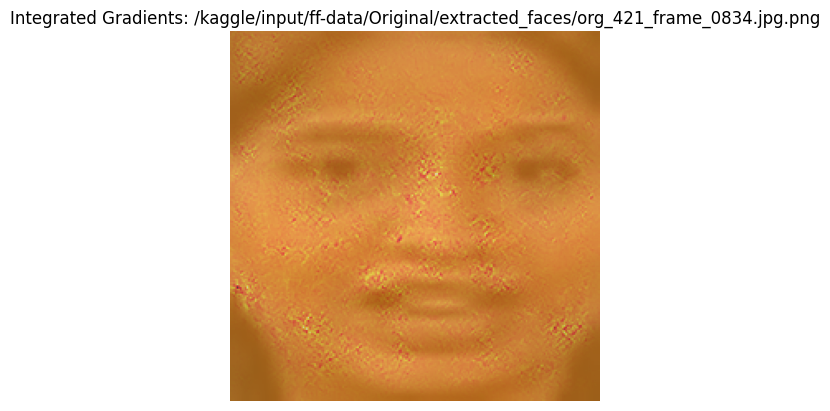

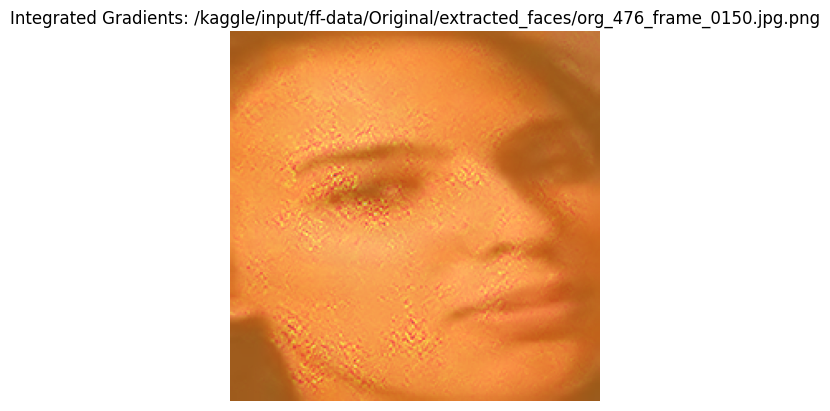

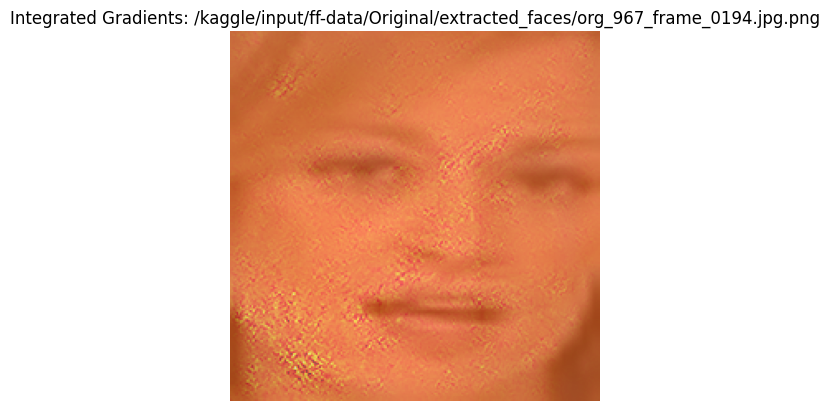

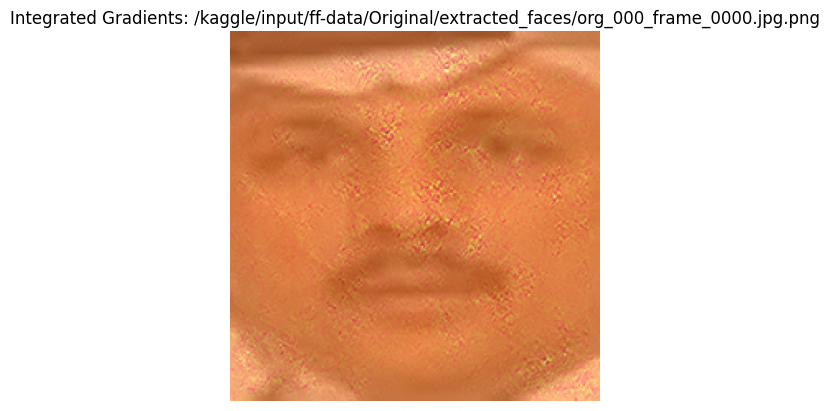

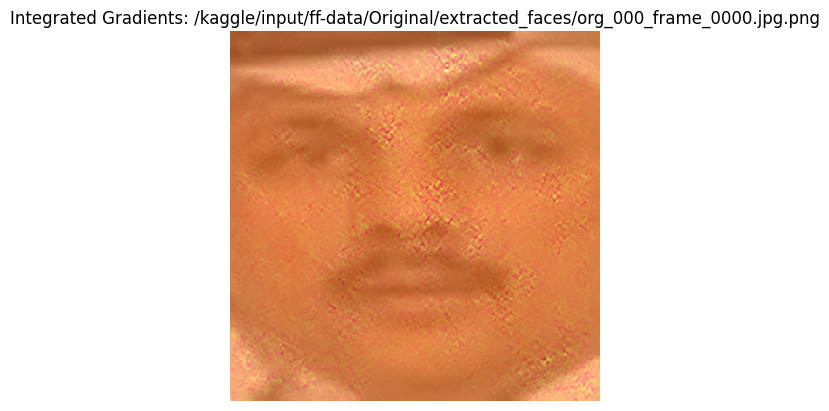

...

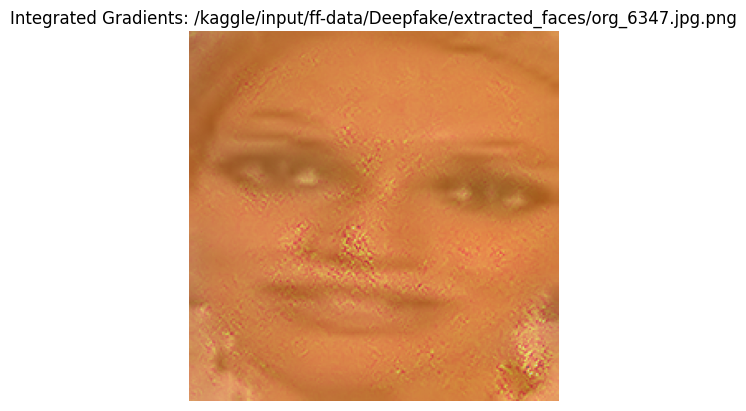

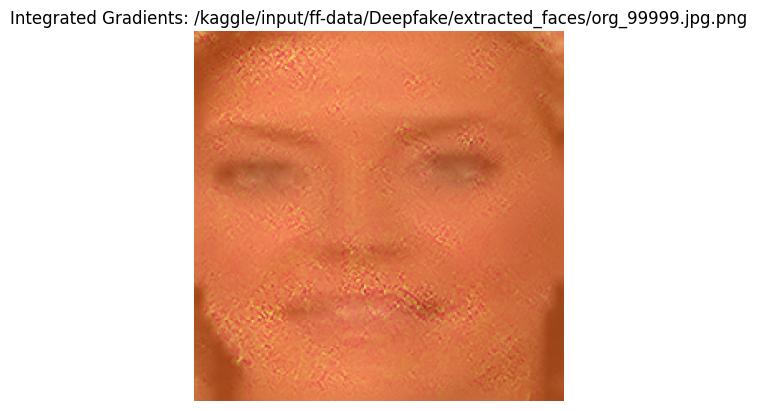

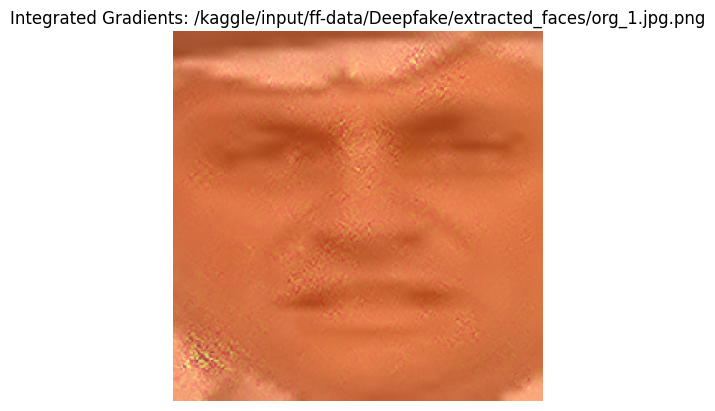

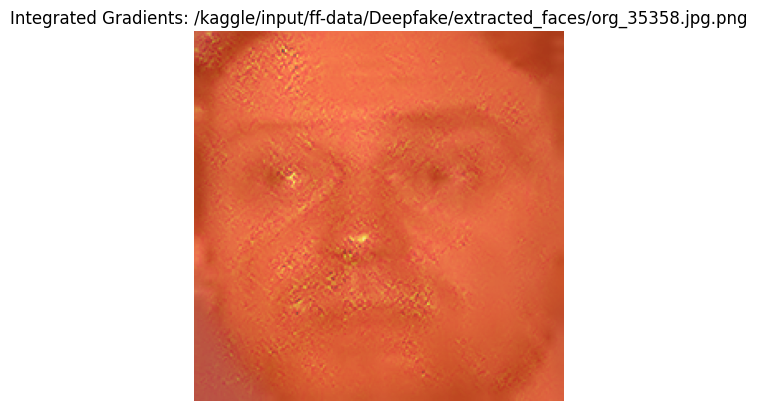

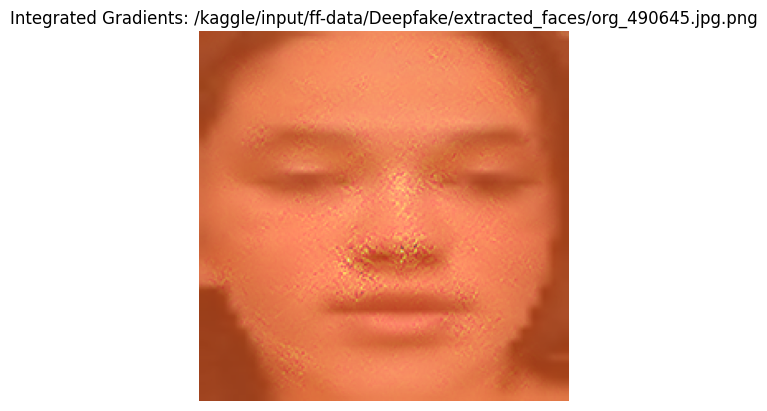

In [ ]:
from captum.attr import IntegratedGradients

ig = IntegratedGradients(wrapped_model)

for image_path in image_paths:
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0).to(device)

    attributions, delta = ig.attribute(img_tensor, target=0, return_convergence_delta=True)

    attributions = attributions.squeeze().cpu().detach().numpy().transpose(1, 2, 0)
    attributions = np.mean(attributions, axis=2)

    attributions = (attributions - attributions.min()) / (attributions.max() - attributions.min())

    plt.imshow(np.array(img.resize((224, 224))), alpha=0.8)
    plt.imshow(attributions, cmap='hot', alpha=0.5)
    plt.title(f'Integrated Gradients: {image_path}')
    plt.axis('off')
    plt.show()

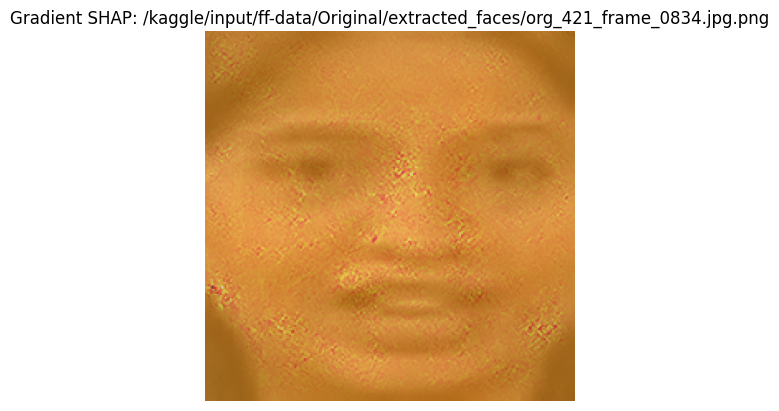

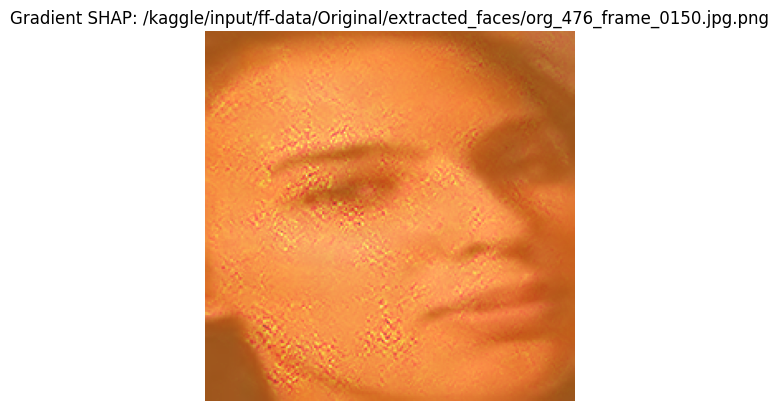

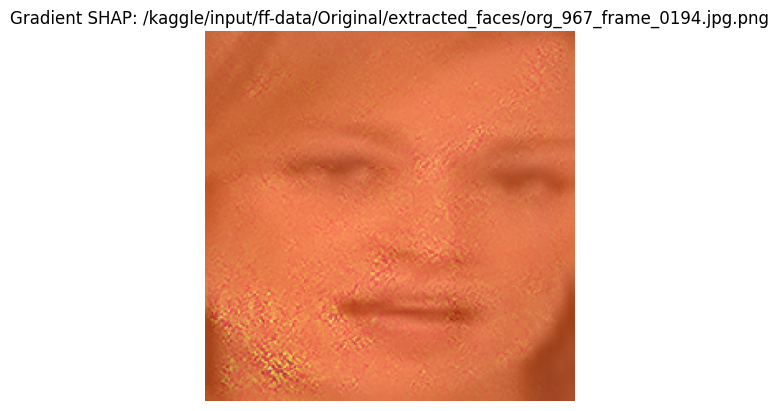

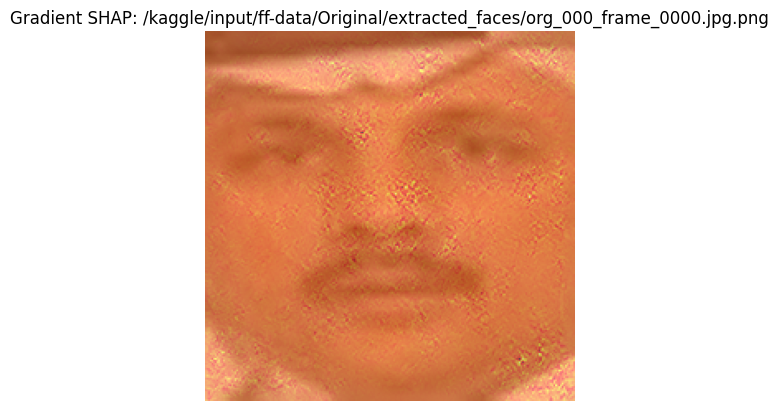

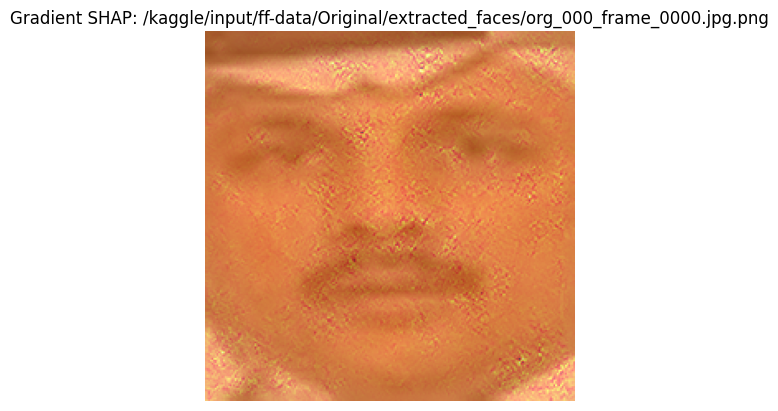

...

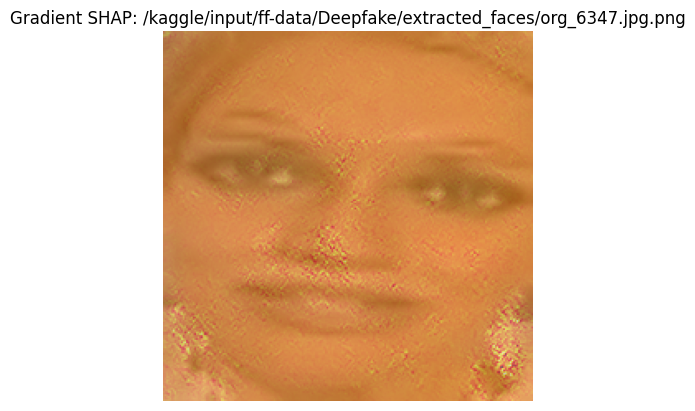

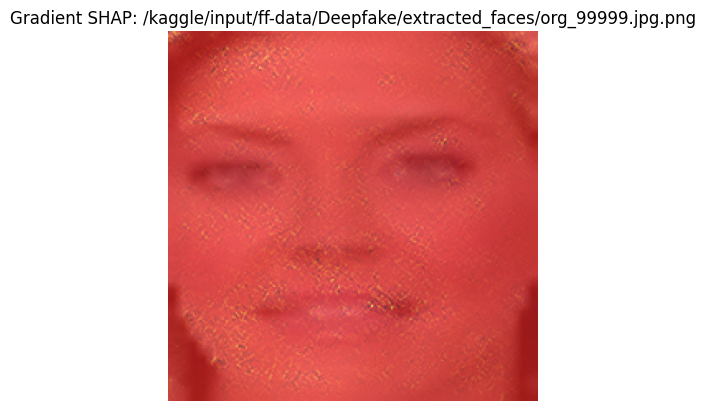

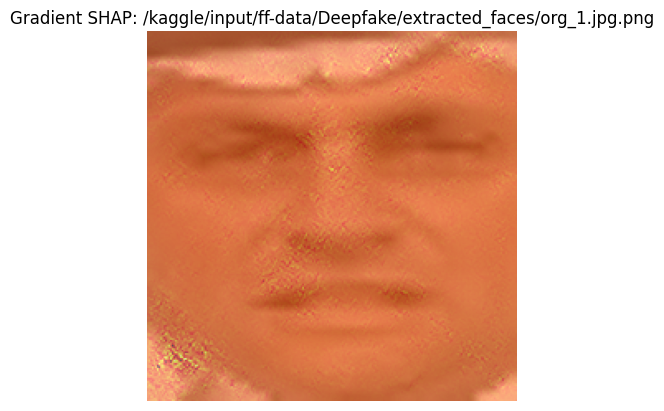

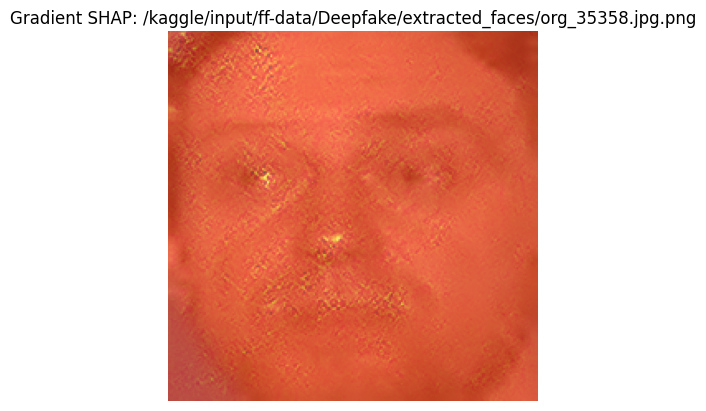

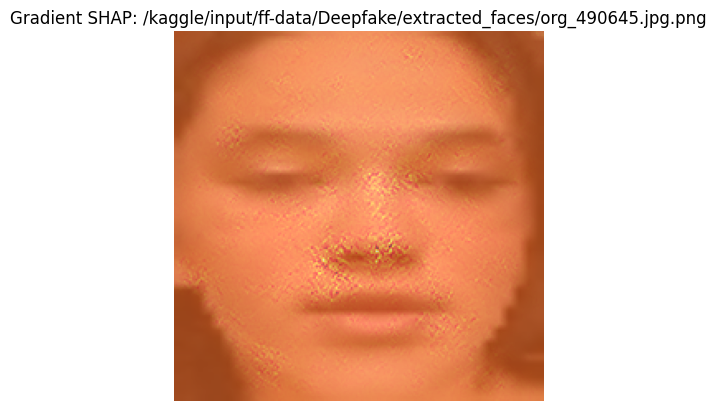

In [ ]:
from captum.attr import GradientShap

gradient_shap = GradientShap(wrapped_model)

background = torch.cat([img_tensor * 0, img_tensor * 1])

for image_path in image_paths:
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0).to(device)
    img_tensor.requires_grad = True

    attributions = gradient_shap.attribute(
        img_tensor,
        baselines=background,
        target=0,
        n_samples=50
    )

    attributions = attributions.squeeze().cpu().detach().numpy().transpose(1, 2, 0)
    attributions = np.mean(attributions, axis=2)

    attributions = (attributions - attributions.min()) / (attributions.max() - attributions.min())

    plt.imshow(np.array(img.resize((224, 224))), alpha=0.8)
    plt.imshow(attributions, cmap='hot', alpha=0.5)
    plt.title(f'Gradient SHAP: {image_path}')
    plt.axis('off')
    plt.show()